In [238]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import math

In [239]:
df_WS = pd.read_csv('~/Downloads/wordbank_data_WS_Produces_en.csv')
df_WS.drop(columns=['downloaded'], inplace=True)
display(df_WS.head())

df_WG = pd.read_csv('~/Downloads/wordbank_data_WG_Produces_en.csv')
df_WG.drop(columns=['downloaded'], inplace=True)
df_WG.head()

,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
0,1,baa baa,sounds,0.46,0.52,0.55,0.66,0.69,0.70,0.66,0.78,0.78,0.78,0.79,0.82,0.89,0.80,0.79
1,2,choo choo,sounds,0.27,0.32,0.39,0.51,0.56,0.60,0.67,0.71,0.76,0.84,0.81,0.85,0.92,0.85,0.88
2,3,cockadoodledoo,sounds,0.13,0.10,0.14,0.22,0.22,0.29,0.31,0.37,0.43,0.45,0.49,0.53,0.70,0.54,0.58
3,4,grrr,sounds,0.54,0.50,0.54,0.63,0.61,0.65,0.63,0.73,0.76,0.76,0.75,0.80,0.90,0.79,0.80
4,5,meow,sounds,0.49,0.47,0.55,0.67,0.69,0.75,0.76,0.80,0.86,0.88,0.88,0.91,0.96,0.91,0.92


,item_id,item_definition,category,8,9,10,11,12,13,14,15,16,17,18
0,34,baa baa,sounds,0.18,0.22,0.25,0.23,0.26,0.26,0.35,0.35,0.45,0.50,0.59
1,35,choo choo,sounds,0.02,0.02,0.02,0.02,0.05,0.06,0.08,0.16,0.27,0.31,0.37
2,36,cockadoodledoo,sounds,0.01,0.01,0.02,0.02,0.01,0.02,0.03,0.08,0.13,0.14,0.19
3,37,grrr,sounds,0.05,0.09,0.18,0.16,0.17,0.26,0.27,0.33,0.52,0.50,0.57
4,38,meow,sounds,0.01,0.04,0.05,0.06,0.10,0.16,0.18,0.27,0.48,0.50,0.57


In [240]:
words = df_WS['item_definition'].unique()
print(len(words))
words = df_WG['item_definition'].unique()
len(words)

680


396

In [241]:
df_WS.shape

(680, 18)

In [242]:
# Not all words in WG are in WS. Check which ones are missing.
print(df_WS.shape, df_WG.shape)
print(df_WG['item_definition'].isin(df_WS['item_definition']).all())
mask = df_WG['item_definition'].isin(df_WS['item_definition'])
missing = df_WG[~mask]
missing

(680, 18) (396, 14)
False


,item_id,item_definition,category,8,9,10,11,12,13,14,15,16,17,18
380,414,in,locations,0.0,0.0,0.02,0.01,0.01,0.01,0.02,0.04,0.05,0.09,0.09
381,415,inside,locations,0.0,0.0,0.01,0.02,0.01,0.00,0.01,0.03,0.02,0.05,0.06


In [243]:
# Actually, it's just that inside and in were combined into one item "inside/in" in WS.
df_WS.iloc[622:623]

,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
622,623,inside/in,locations,0.07,0.07,0.13,0.21,0.19,0.23,0.35,0.44,0.49,0.55,0.6,0.63,0.82,0.7,0.72


In [244]:
# Let's split the "inside/in" row into two rows, one for "inside" and one for "in".

# --- 1. Isolate the row and create copies ---

# Isolate the target row
original_row = df_WS[df_WS['item_definition'] == 'inside/in'].copy()

# Create the new 'in' row (deepcopy is a safe practice)
new_row_in = original_row.copy()
new_row_in['item_definition'] = 'in'

# Create the new 'inside' row
new_row_inside = original_row.copy()
new_row_inside['item_definition'] = 'inside'


# --- 2. Remove the original row from the main DataFrame ---

# Filter out the 'inside/in' row.
df_WS = df_WS[df_WS['item_definition'] != 'inside/in'].copy()


# --- 3. Concatenate the filtered DF with the two new rows ---

# Combine the filtered data with the two new rows
df_WS = pd.concat(
    [df_WS, new_row_in, new_row_inside],
    ignore_index=True  # Optional: resets the index
)

print("Updated DataFrame (New 'in' and 'inside' rows added):")
display(df_WS[df_WS['item_definition'].isin(['in', 'inside'])])

Updated DataFrame (New 'in' and 'inside' rows added):


,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
679,623,in,locations,0.07,0.07,0.13,0.21,0.19,0.23,0.35,0.44,0.49,0.55,0.6,0.63,0.82,0.7,0.72
680,623,inside,locations,0.07,0.07,0.13,0.21,0.19,0.23,0.35,0.44,0.49,0.55,0.6,0.63,0.82,0.7,0.72


In [245]:
# Now all words in WG should be in WS
print(df_WG['item_definition'].isin(df_WS['item_definition']).all())

True


In [246]:
# Which words in WS are not in WG?
df_WS[~df_WS['item_definition'].isin(df_WG['item_definition'])]

,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
12,13,alligator,animals,0.02,0.04,0.06,0.12,0.11,0.18,0.24,0.30,0.39,0.46,0.48,0.50,0.74,0.65,0.66
14,15,ant,animals,0.04,0.06,0.10,0.17,0.18,0.20,0.25,0.36,0.42,0.48,0.50,0.54,0.74,0.63,0.64
33,34,hen,animals,0.01,0.03,0.02,0.05,0.04,0.10,0.09,0.14,0.16,0.19,0.20,0.23,0.44,0.28,0.29
39,40,moose,animals,0.02,0.07,0.05,0.09,0.08,0.11,0.13,0.23,0.24,0.26,0.27,0.29,0.49,0.38,0.41
46,47,rooster,animals,0.02,0.03,0.03,0.06,0.08,0.11,0.13,0.23,0.25,0.31,0.33,0.40,0.57,0.42,0.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674,676,because,connecting_words,0.00,0.02,0.01,0.03,0.03,0.03,0.06,0.10,0.10,0.13,0.21,0.25,0.36,0.35,0.42
675,677,but,connecting_words,0.00,0.02,0.02,0.03,0.02,0.03,0.06,0.07,0.07,0.10,0.14,0.19,0.26,0.30,0.33
676,678,if,connecting_words,0.00,0.02,0.02,0.02,0.01,0.01,0.03,0.04,0.04,0.07,0.09,0.12,0.18,0.21,0.22
677,679,so,connecting_words,0.00,0.03,0.02,0.03,0.03,0.04,0.07,0.08,0.10,0.12,0.15,0.23,0.29,0.29,0.33


In [ ]:
# Notes:
    
# 1) Across the board, the data for 28 months seems unusally high. For basically every word, the max proportion
# occurs at 28 months, and even sometimes decreases at 29 and 30 months. Maybe drop the 28 column?
# Sara mentioned that there might be a deveelopmental explanation for this.

# TODO:

# 2) Find article explaining 28-month anomaly.

In [249]:
age_cols = [str(a) for a in range(8, 19)]

baa_baa_WG = df_WG.iloc[0,:]
baa_baa_WG_proportions = baa_baa_WG.loc[age_cols]

# 3. Create a DataFrame suitable for plotting with seaborn
baa_baa_WG_df = pd.DataFrame({
    # Age is the index label, which we convert to integer for plotting
    'Age': baa_baa_WG_proportions.index.astype(int),
    # Proportion is the value associated with each age
    'Proportion Acquired': baa_baa_WG_proportions.values
})
display(baa_baa_WG_df)

age_cols = [str(a) for a in range(16, 31)]
baa_baa_WS = df_WS.iloc[0,:]
baa_baa_WS_proportions = baa_baa_WS.loc[age_cols]

# 3. Create a DataFrame suitable for plotting with seaborn
baa_baa_WS_df = pd.DataFrame({
    # Age is the index label, which we convert to integer for plotting
    'Age': baa_baa_WS_proportions.index.astype(int),
    # Proportion is the value associated with each age
    'Proportion Acquired': baa_baa_WS_proportions.values
})
display(baa_baa_WS_df)

,Age,Proportion Acquired
0,8,0.18
1,9,0.22
2,10,0.25
3,11,0.23
4,12,0.26
5,13,0.26
6,14,0.35
7,15,0.35
8,16,0.45
9,17,0.5


,Age,Proportion Acquired
0,16,0.46
1,17,0.52
2,18,0.55
3,19,0.66
4,20,0.69
5,21,0.7
6,22,0.66
7,23,0.78
8,24,0.78
9,25,0.78


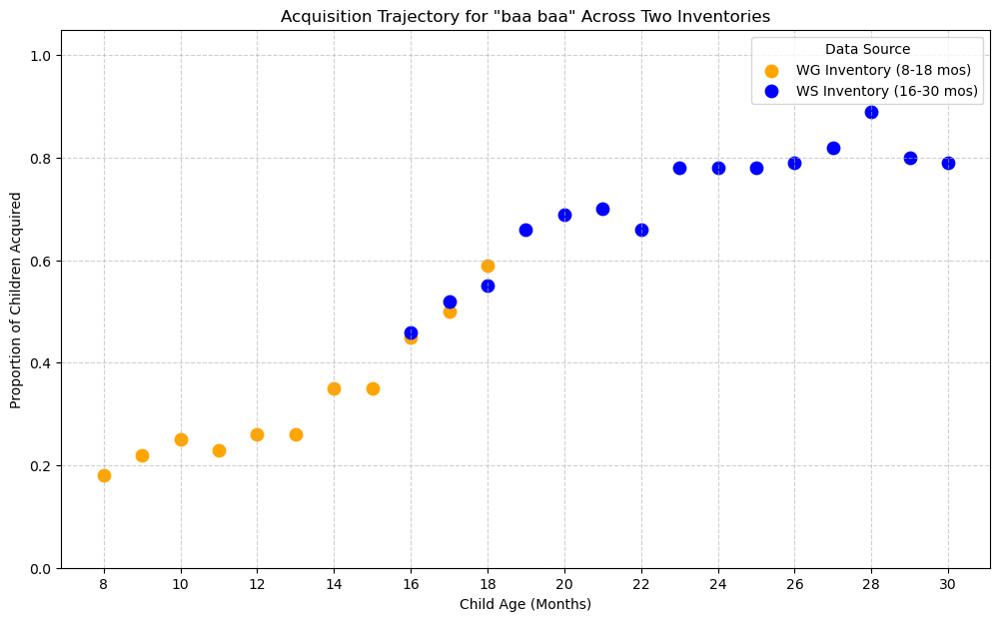

In [250]:
plt.figure(figsize=(12, 7))

# Plot WG Data (Orange Dots)
plt.scatter(
    baa_baa_WG_df['Age'],
    baa_baa_WG_df['Proportion Acquired'],
    color='orange',
    s=80,
    label='WG Inventory (8-18 mos)'
)

# Plot WS Data (Blue Dots)
plt.scatter(
    baa_baa_WS_df['Age'],
    baa_baa_WS_df['Proportion Acquired'],
    color='blue',
    s=80,
    label='WS Inventory (16-30 mos)'
)

# --- 4. Customizing the Plot ---
plt.title('Acquisition Trajectory for "baa baa" Across Two Inventories')
plt.xlabel('Child Age (Months)')
plt.ylabel('Proportion of Children Acquired')
plt.ylim(0, 1.05)
# Set x-ticks to appear every 2 months from 8 to 30
plt.xticks(np.arange(8, 31, 2))
plt.legend(title='Data Source')
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

In [251]:
baa_baa_WG_df['Inventory'] = 'WG'
baa_baa_WS_df['Inventory'] = 'WS'
baa_baa_df = pd.concat([baa_baa_WG_df, baa_baa_WS_df], ignore_index=True)
display(baa_baa_df.head())
baa_baa_df.tail()

,Age,Proportion Acquired,Inventory
0,8,0.18,WG
1,9,0.22,WG
2,10,0.25,WG
3,11,0.23,WG
4,12,0.26,WG


,Age,Proportion Acquired,Inventory
21,26,0.79,WS
22,27,0.82,WS
23,28,0.89,WS
24,29,0.8,WS
25,30,0.79,WS


Fitted Parameters for Acquisition Trajectory:
----------------------------------------
  Maximum Proportion (L): 0.8755
  Growth Rate (k): 0.2261
  Model-based Median AoA (x0): 15.43 months


<Figure size 1000x600 with 0 Axes>

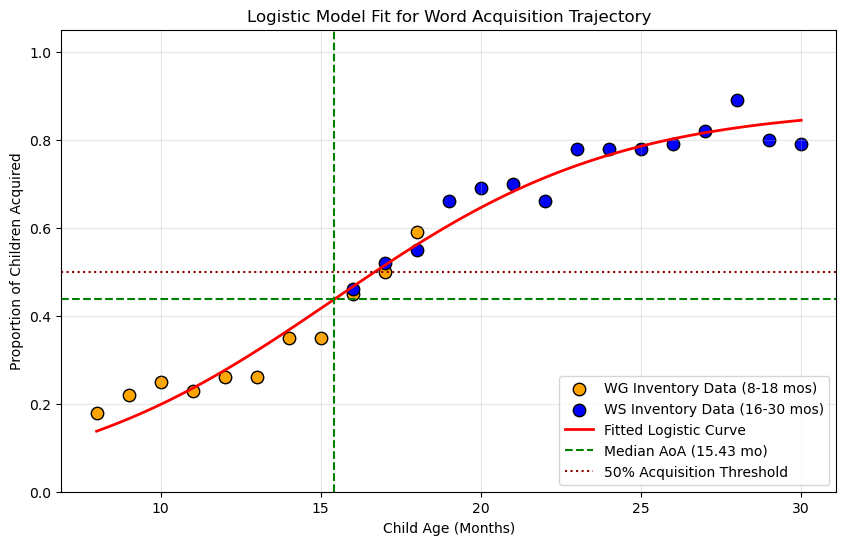

In [252]:
def sigmoid_3param(age, L, k, x0):
    """
    L: Maximum value (asymptote).
    k: Growth rate (steepness).
    x0: Inflection point (Median Age of Acquisition estimate).
    """
    return L / (1 + np.exp(-k * (age - x0)))

# --- 3. Extract Data for Fitting ---
X = baa_baa_df['Age'].values  # Independent variable (Age)
Y = baa_baa_df['Proportion Acquired'].values # Dependent variable (Proportion)

# --- 4. Perform the Curve Fit ---
# p0 provides initial "guesses" for the parameters (L, k, x0).
popt, pcov = curve_fit(sigmoid_3param, X, Y, p0=[1.0, 0.5, 22])

# Extract the optimal fitted parameters
L_fit, k_fit, x0_fit = popt

# --- 5. Print Results ---
print("Fitted Parameters for Acquisition Trajectory:")
print("-" * 40)
print(f"  Maximum Proportion (L): {L_fit:.4f}")
print(f"  Growth Rate (k): {k_fit:.4f}")
print(f"  Model-based Median AoA (x0): {x0_fit:.2f} months")

# --- 6. Plot the Fitted Curve vs. Raw Data ---
X_fit = np.linspace(X.min(), X.max(), 100)
preds = sigmoid_3param(X_fit, L_fit, k_fit, x0_fit)

plt.figure(figsize=(10, 6))

# --- Filter the Combined Data ---
df_wg = baa_baa_df[baa_baa_df['Inventory'] == 'WG']
df_ws = baa_baa_df[baa_baa_df['Inventory'] == 'WS']

plt.figure(figsize=(10, 6))

# 1. Raw Data Points: WG (Orange)
plt.scatter(
    df_wg['Age'],
    df_wg['Proportion Acquired'],
    label='WG Inventory Data (8-18 mos)',
    color='orange',
    s=80,
    edgecolors='black'
)

# 2. Raw Data Points: WS (Blue)
plt.scatter(
    df_ws['Age'],
    df_ws['Proportion Acquired'],
    label='WS Inventory Data (16-30 mos)',
    color='blue',
    s=80,
    edgecolors='black'
)

# Fitted Curve
plt.plot(X_fit, preds, label='Fitted Logistic Curve', color='red', linestyle='-', linewidth=2)

# Highlight the estimated AoA
plt.axvline(x=x0_fit, color='green', linestyle='--', label=f'Median AoA ({x0_fit:.2f} mo)')
plt.axhline(y=L_fit / 2, color='green', linestyle='--')

# Compare to 50% acquisition line
plt.axhline(y=0.5, color='darkred', linestyle=':', label='50% Acquisition Threshold', linewidth=1.5)

plt.title('Logistic Model Fit for Word Acquisition Trajectory')
plt.xlabel('Child Age (Months)')
plt.ylabel('Proportion of Children Acquired')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

Fitted Parameters for Acquisition Trajectory:
----------------------------------------
  Growth Rate (k): 0.1708
  Model-based Median AoA (x0): 17.07 months


<Figure size 1000x600 with 0 Axes>

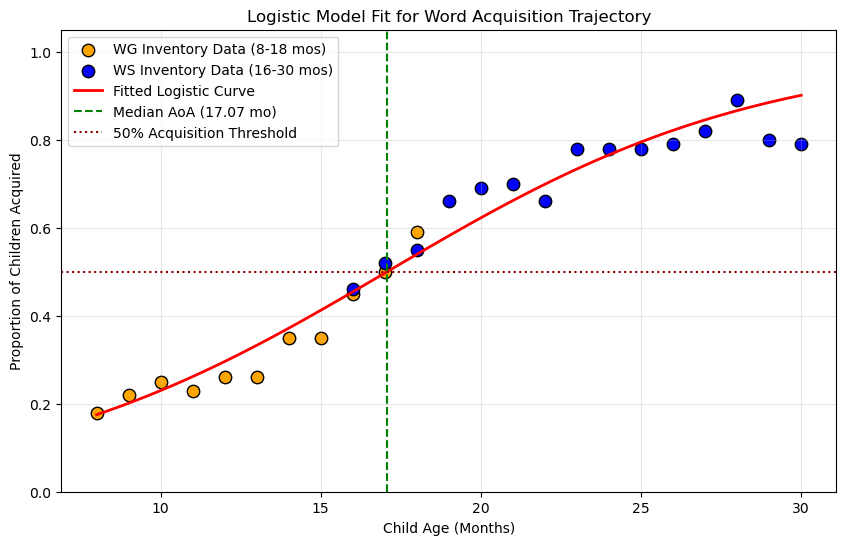

In [253]:
# Let's try a 2-parameter sigmoid, fixing L=1, instead
def sigmoid(age, k, x0):
    """
    k: Growth rate.
    x0: Inflection point / Median AoA.
    """
    return 1 / (1 + np.exp(-k * (age - x0)))

# --- 3. Extract Data for Fitting ---
X = baa_baa_df['Age'].values  # Independent variable (Age)
Y = baa_baa_df['Proportion Acquired'].values # Dependent variable (Proportion)

# --- 4. Perform the Curve Fit ---
# p0 provides initial "guesses" for the parameters (L, k, x0).
popt, pcov = curve_fit(sigmoid, X, Y, p0=[0.5, 22])

# Extract the optimal fitted parameters
k_fit, x0_fit = popt

# --- 5. Print Results ---
print("Fitted Parameters for Acquisition Trajectory:")
print("-" * 40)
print(f"  Growth Rate (k): {k_fit:.4f}")
print(f"  Model-based Median AoA (x0): {x0_fit:.2f} months")

# --- 6. Plot the Fitted Curve vs. Raw Data ---
X_fit = np.linspace(X.min(), X.max(), 100)
preds = sigmoid(X_fit, k_fit, x0_fit)

plt.figure(figsize=(10, 6))

# --- Filter the Combined Data ---
df_wg = baa_baa_df[baa_baa_df['Inventory'] == 'WG']
df_ws = baa_baa_df[baa_baa_df['Inventory'] == 'WS']

plt.figure(figsize=(10, 6))

# 1. Raw Data Points: WG (Orange)
plt.scatter(
    df_wg['Age'],
    df_wg['Proportion Acquired'],
    label='WG Inventory Data (8-18 mos)',
    color='orange',
    s=80,
    edgecolors='black'
)

# 2. Raw Data Points: WS (Blue)
plt.scatter(
    df_ws['Age'],
    df_ws['Proportion Acquired'],
    label='WS Inventory Data (16-30 mos)',
    color='blue',
    s=80,
    edgecolors='black'
)

# Fitted Curve
plt.plot(X_fit, preds, label='Fitted Logistic Curve', color='red', linestyle='-', linewidth=2)

# Highlight the estimated AoA
plt.axvline(x=x0_fit, color='green', linestyle='--', label=f'Median AoA ({x0_fit:.2f} mo)')
#plt.axhline(y=L_fit / 2, color='green', linestyle='--')

# Compare to 50% acquisition line
plt.axhline(y=0.5, color='darkred', linestyle=':', label='50% Acquisition Threshold', linewidth=1.5)

plt.title('Logistic Model Fit for Word Acquisition Trajectory')
plt.xlabel('Child Age (Months)')
plt.ylabel('Proportion of Children Acquired')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [254]:
display(baa_baa_df)
x0_fit

,Age,Proportion Acquired,Inventory
0,8,0.18,WG
1,9,0.22,WG
2,10,0.25,WG
3,11,0.23,WG
4,12,0.26,WG
5,13,0.26,WG
6,14,0.35,WG
7,15,0.35,WG
8,16,0.45,WG
9,17,0.5,WG


np.float64(17.07085584708239)

In [255]:
df_curve_fits = pd.DataFrame(columns=['item_definition', 'Growth Rate', 'Median AoA'])
df_curve_fits['item_definition'] = df_WS['item_definition']
print(df_curve_fits)

    item_definition Growth Rate Median AoA
0           baa baa         NaN        NaN
1         choo choo         NaN        NaN
2    cockadoodledoo         NaN        NaN
3              grrr         NaN        NaN
4              meow         NaN        NaN
..              ...         ...        ...
676              if         NaN        NaN
677              so         NaN        NaN
678            then         NaN        NaN
679              in         NaN        NaN
680          inside         NaN        NaN

[681 rows x 3 columns]


In [256]:
#df_WS_test_row = df_WS[df_WS['item_definition'] == 'baa baa']
df_WS_test_row = df_WS[df_WS['item_definition'] == 'ant']
item_def = df_WS_test_row['item_definition'].item()
df_WG_test_row = df_WG[df_WG['item_definition'] == item_def]

display(df_WS_test_row)
display(df_WG_test_row)

df_WS_test_row.columns.difference(['item_id', 'item_definition', 'category'])

,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
14,15,ant,animals,0.04,0.06,0.1,0.17,0.18,0.2,0.25,0.36,0.42,0.48,0.5,0.54,0.74,0.63,0.64


,item_id,item_definition,category,8,9,10,11,12,13,14,15,16,17,18


Index(['16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27',
       '28', '29', '30'],
      dtype='object')

In [257]:
print(df_WS_test_row)
print(df_WG_test_row)

    item_id item_definition category    16    17   18    19    20   21    22  \
14       15             ant  animals  0.04  0.06  0.1  0.17  0.18  0.2  0.25   

      23    24    25   26    27    28    29    30  
14  0.36  0.42  0.48  0.5  0.54  0.74  0.63  0.64  
Empty DataFrame
Columns: [item_id, item_definition, category, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
Index: []


In [258]:
# def row_to_df_for_fit(df_row):
#     """
#     Transforms a single wide-format DataFrame row into a clean long-format 
#     DataFrame (Age, Proportion) for logistic regression fitting.
    
#     Args:
#         df_row (pd.DataFrame): A DataFrame containing exactly one row 
#                                of acquisition data
#     """
#     # 1. Correctly identify data columns by excluding metadata columns
#     EXCLUDE_COLS = ['item_id', 'item_definition', 'category']
#     age_cols = df_row.columns.difference(EXCLUDE_COLS)
    
#     # 2. Correctly slice the DataFrame to get only the data values (Columns specified directly)
#     # This result is still a 1-row DataFrame.
#     proportions_wide = df_row[age_cols].copy()
    
#     # 3. Use pd.melt() on the single row to easily create the long format
#     row_df = pd.melt(
#         proportions_wide,
#         ignore_index=False, # Important to keep the original index during melt
#         value_vars=age_cols,
#         var_name='Age',
#         value_name='Proportion Acquired'
#     )
    
#     # 4. Final cleaning and type conversion
#     row_df = row_df.dropna(subset=['Proportion Acquired'])
#     row_df['Age'] = row_df['Age'].astype(int)
#     row_df = row_df.sort_values(by='Age')
    
#     return row_df.reset_index(drop=True)

In [259]:
# row_WS_df = row_to_df_for_fit(df_WS_test_row)
# row_WG_df = row_to_df_for_fit(df_WG_test_row)
# display(row_WS_df)
# row_WG_df

In [260]:
# row_WS_df['Inventory'] = 'WS'
# row_WG_df['Inventory'] = 'WG'
# row_df_combined = pd.concat([row_WG_df, row_WS_df], ignore_index=True)
# display(row_df_combined.head())
# row_df_combined.tail()

In [261]:
# def calculate_sigmoid_params(row_combined):
#     """
#     Fits the sigmoid curve to a single row and returns the parameters (k, x0).
#     """
#     X = row_combined['Age'].values  # Independent variable (Age)
#     Y = row_combined['Proportion Acquired'].values
#     p0 = [0.5, 22] # Initial guesses (k, x0)

#     try:
#         # --- 4. Perform the Curve Fit ---
#         # p0 provides initial "guesses" for the parameters (L, k, x0).
#         popt, pcov = curve_fit(sigmoid, X, Y, p0=[0.5, 22])
        
#         # Return all three fitted parameters
#         return pd.Series(popt, index=['k_fit', 'x0_fit'])
        
#     except RuntimeError:
#         # If the fit fails, return a row of NaN values
#         print(f"Warning: Curve fit failed for row/word. Returning NaN.")
#         return pd.Series([np.nan, np.nan], index=['k_fit', 'x0_fit'])

In [262]:
# calculate_sigmoid_params(row_df_combined)

In [263]:
# def combined_logistic_regression(row_WS):
#     '''
#     Given a single WS row, find the corresponding WG row (if it exists),
#     combine the data, and fit a logistic regression to the combined data.
#     '''
#     # Find corresponding WG row, if it exists
#     item_def = df_WS_test_row['item_definition'].item()
#     df_WG_test_row = df_WG[df_WG['item_definition'] == item_def]
    
#     row_WS_df = row_to_df_for_fit(df_WS_test_row)
#     row_WG_df = row_to_df_for_fit(df_WG_test_row)
#     row_df_combined = pd.concat([row_WG_df, row_WS_df], ignore_index=True)
#     return calculate_sigmoid_params(row_df_combined)

In [264]:
df_curve_fits

,item_definition,Growth Rate,Median AoA
0,baa baa,NaN,NaN
1,choo choo,NaN,NaN
2,cockadoodledoo,NaN,NaN
3,grrr,NaN,NaN
4,meow,NaN,NaN
...,...,...,...
676,if,NaN,NaN
677,so,NaN,NaN
678,then,NaN,NaN
679,in,NaN,NaN


In [265]:
# df_curve_fits[['Growth Rate', 'Median AoA']] = df_WS.apply(calculate_sigmoid_params, axis=1)

In [266]:
df_WS.shape

(681, 18)

In [271]:
# --- 2. Helper Functions (Reused from previous steps) ---

def row_to_df_for_fit(row_data):
    """Transforms a single wide-format row into a clean long-format DataFrame."""
    if isinstance(row_data, pd.Series):
        df_row = row_data.to_frame().T
    else:
        df_row = row_data

    EXCLUDE_COLS = ['item_id', 'item_definition', 'category']
    age_cols = df_row.columns.difference(EXCLUDE_COLS)
    
    proportions_wide = df_row[age_cols]
    
    row_df = pd.melt(
        proportions_wide,
        value_vars=age_cols,
        var_name='Age',
        value_name='Proportion Acquired'
    )
    
    row_df = row_df.dropna(subset=['Proportion Acquired'])
    row_df['Age'] = row_df['Age'].astype(int)
    row_df = row_df.sort_values(by='Age')
    
    return row_df.reset_index(drop=True)

def calculate_sigmoid_params(df_combined):
    """
    Fits the sigmoid curve to the combined long-format data. 
    """
    X = df_combined['Age'].values
    Y = df_combined['Proportion Acquired'].values
    p0 = [0.5, X.mean() if X.size > 0 else 20] 

    try:
        popt, pcov = curve_fit(sigmoid, X, Y, p0=p0, maxfev=5000)
        return pd.Series(
            {'Growth Rate': popt[0], 'Median AoA': popt[1]}
        )
    except RuntimeError:
        return pd.Series({'Growth Rate': np.nan, 'Median AoA': np.nan})

# --- 3. The New Plotting Function (Refactored to use an ax object) ---

def plot_acquisition_curve(ax, word, df_data, k_fit, x0_fit):
    """
    Generates a scatter plot of the raw data, overlays the fitted logistic curve,
    and adds median AoA and 50% lines onto the provided Axes (ax) object.
    """
    
    # Define colors for scatter plot (Requirement 1 & 2)
    palette = {'WS': 'blue', 'WG': 'orange'}
    sns.scatterplot(
        data=df_data,
        x='Age',
        y='Proportion Acquired',
        hue='Inventory',
        palette=palette,
        s=40, # Smaller points for better visibility in a grid
        edgecolor='black',
        alpha=0.7,
        zorder=3,
        ax=ax # Pass the axis object to seaborn
    )

    # --- Generate and Plot Fitted Curve (Requirement 3) ---
    x_range = np.linspace(df_data['Age'].min() - 5, df_data['Age'].max() + 5, 100)
    y_fitted = sigmoid(x_range, k_fit, x0_fit)
    
    ax.plot(
        x_range, 
        y_fitted, 
        color='green', 
        linewidth=1.5, 
        label=f'Fitted Curve (k={k_fit:.2f})'
    )

    # --- Plot Vertical Median AoA Line (Requirement 4) ---
    ax.axvline(
        x=x0_fit,
        color='green',
        linestyle='--',
        linewidth=1,
        label=f'Median AoA ({x0_fit:.1f} mos)',
        alpha=0.7
    )
    
    # --- Plot Horizontal 50% Acquisition Line (Requirement 5) ---
    ax.axhline(
        y=0.5, 
        color='red', 
        linestyle='--', 
        linewidth=1, 
        label='50% Threshold',
        alpha=0.7
    )

    # --- Customization ---
    ax.set_title(f'{word}', fontsize=10)
    ax.set_xlabel('Age (Months)', fontsize=8)
    ax.set_ylabel('Prop. Acquired', fontsize=8)
    ax.set_ylim(0, 1.05)
    ax.set_xlim(df_data['Age'].min() - 2, df_data['Age'].max() + 2)
    ax.grid(axis='both', linestyle=':', alpha=0.5)
    
    # Remove the legend from each subplot to keep the grid clean
    if ax.get_legend() is not None:
        ax.get_legend().remove()
    
# Create the fast lookup dictionary for df_WG
wg_dict = df_WG.set_index('item_definition').T.to_dict('series')

# --- 5. EXECUTION & PLOTTING LOOP (Updated for Grid Layout) ---

# Step A: Compute the Fits (refactored to return plot data explicitly)
def combined_logistic_regression(ws_row, wg_dict):
    item_def = ws_row['item_definition']
    row_WS_long = row_to_df_for_fit(ws_row)
    
    if item_def in wg_dict:
        wg_row_series = wg_dict[item_def]
        row_WG_long = row_to_df_for_fit(wg_row_series)
        row_WG_long['Inventory'] = 'WG' # Tag the data source
        row_WS_long['Inventory'] = 'WS' # Tag WS data here too
        row_df_combined = pd.concat([row_WG_long, row_WS_long], ignore_index=True)
    else:
        # If no WG match, tag the WS data
        row_WS_long['Inventory'] = 'WS' 
        row_df_combined = row_WS_long
    
    # Fit the curve
    fit_params = calculate_sigmoid_params(row_df_combined)
    
    # Add the plotting data to the Series being returned by .apply()
    fit_params['__plot_data__'] = row_df_combined
    
    return fit_params

# Run the fit and store results (results now includes all three keys)
results = df_WS.apply(combined_logistic_regression, axis=1, wg_dict=wg_dict)

# Initialize df_curve_fits and assign columns from the 'results' DataFrame
df_curve_fits = df_WS[['item_definition']].copy()
df_curve_fits['Growth Rate'] = results['Growth Rate']
df_curve_fits['Median AoA'] = results['Median AoA']

# Assign the plot data directly from the collected 'results' Series
df_curve_fits['__plot_data__'] = results['__plot_data__']

print("--- Generated Plots (Displayed in a 6-Column Grid) ---")

# Step B: Setup Grid and Plot
valid_fits = df_curve_fits[~pd.isna(df_curve_fits['Growth Rate'])]
num_plots = len(valid_fits)
COLS = 6 # Your specified number of columns
ROWS = math.ceil(num_plots / COLS)

# Set the overall figure size (adjust as needed for readability)
fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS * 3.5, ROWS * 3))

# Flatten the axes array for simplified, reliable indexing
if not isinstance(axes, np.ndarray):
    # Handles the case where ROWS=1 and COLS=1 (axes is a single object)
    axes = np.array([axes])
else:
    # Handles (1,N), (N,1), and (N,M) grids by flattening them to 1D
    axes = axes.ravel() 

plot_index = 0
for index, row in valid_fits.iterrows():
    word = row['item_definition']
    k_fit = row['Growth Rate']
    x0_fit = row['Median AoA']
    df_plot_data = row['__plot_data__']
    
    # Use the simple 1D index to access the correct subplot
    ax = axes[plot_index] 
    
    # Plot the curve using the current axis
    plot_acquisition_curve(ax, word, df_plot_data, k_fit, x0_fit)
    
    plot_index += 1

# Hide any unused subplots
for i in range(plot_index, ROWS * COLS):
    # Use the simple 1D index to hide axes
    axes[i].axis('off')

# Add a title for the entire figure and adjust layout
fig.suptitle('Combined Acquisition Curve Fits', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust rect to make space for suptitle
plt.show()

if len(df_curve_fits) != len(valid_fits):
    print(f"\nSkipped {len(df_curve_fits) - len(valid_fits)} items due to failed curve fit (NaN parameters).")


--- Generated Plots (Displayed in a 6-Column Grid) ---


In [272]:
df_WS.shape
df_WS.tail()

,item_id,item_definition,category,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
676,678,if,connecting_words,0.00,0.02,0.02,0.02,0.01,0.01,0.03,0.04,0.04,0.07,0.09,0.12,0.18,0.21,0.22
677,679,so,connecting_words,0.00,0.03,0.02,0.03,0.03,0.04,0.07,0.08,0.10,0.12,0.15,0.23,0.29,0.29,0.33
678,680,then,connecting_words,0.00,0.02,0.01,0.02,0.02,0.02,0.02,0.07,0.07,0.08,0.15,0.19,0.27,0.28,0.30
679,623,in,locations,0.07,0.07,0.13,0.21,0.19,0.23,0.35,0.44,0.49,0.55,0.60,0.63,0.82,0.70,0.72
680,623,inside,locations,0.07,0.07,0.13,0.21,0.19,0.23,0.35,0.44,0.49,0.55,0.60,0.63,0.82,0.70,0.72


In [275]:
df_curve_fits[['item_definition', 'Growth Rate', 'Median AoA']]

,item_definition,Growth Rate,Median AoA
0,baa baa,0.170837,17.070855
1,choo choo,0.294834,19.795019
2,cockadoodledoo,0.197258,26.276426
3,grrr,0.185215,17.844426
4,meow,0.312109,17.455202
...,...,...,...
676,if,0.284431,33.994985
677,so,0.257968,32.310811
678,then,0.292023,32.312222
679,in,0.285569,24.633269


In [281]:
# --- NOTE ---
# This script assumes that df_WS, df_WG, and df_curve_fits have been successfully created 
# and are available in the current environment.

# 1. Define the metadata/exclusion columns
METADATA_COLS = ['item_id', 'item_definition', 'category']
FIT_RESULT_COLS = ['item_definition', 'Growth Rate', 'Median AoA']

# 2. Select the required columns and set 'item_definition' as the index for joining

# Fit Results (Base DataFrame): Start with fit results and set index
df_fit_summary = df_curve_fits[FIT_RESULT_COLS].copy()
df_fit_summary = df_fit_summary.set_index('item_definition')

# --- WS Age Data Processing ---
AGE_COLS_WS = df_WS.columns.difference(METADATA_COLS).tolist()
df_age_data_WS = df_WS[['item_definition'] + AGE_COLS_WS].set_index('item_definition')
# CRITICAL FIX: Add suffix to uniquely identify WS age data
df_age_data_WS.columns = [f'{col}_WS' if col in AGE_COLS_WS else col for col in df_age_data_WS.columns]

# --- WG Age Data Processing ---
AGE_COLS_WG = df_WG.columns.difference(METADATA_COLS).tolist()
df_age_data_WG = df_WG[['item_definition'] + AGE_COLS_WG].set_index('item_definition')
# CRITICAL FIX: Add suffix to uniquely identify WG age data
df_age_data_WG.columns = [f'{col}_WG' if col in AGE_COLS_WG else col for col in df_age_data_WG.columns]


# 3. Join the DataFrames horizontally using the 'item_definition' index.
# The age columns are now unique (e.g., '16_WS', '16_WG'), preventing overlap issues.
df_final_report = df_fit_summary.join(df_age_data_WS, how='left')
df_final_report = df_final_report.join(df_age_data_WG, how='left')

# Reset the index to make item_definition a regular column and put it first
df_final_report = df_final_report.reset_index()

# 4. Final display and shape check (including column reordering for clean output)

# Collect all new age columns (now uniquely named)
ws_suffix_cols = [f'{col}_WS' for col in AGE_COLS_WS]
wg_suffix_cols = [f'{col}_WG' for col in AGE_COLS_WG]
all_age_cols = sorted(list(set(ws_suffix_cols + wg_suffix_cols)))

FINAL_COL_ORDER = ['item_definition', 'Growth Rate', 'Median AoA'] + all_age_cols
df_final_report = df_final_report[FINAL_COL_ORDER]


print("--- Final Combined Report (Fit Results + WG/WS Age Proportions) ---")
df_final_report.head()

--- Final Combined Report (Fit Results + WG/WS Age Proportions) ---


,item_definition,Growth Rate,Median AoA,10_WG,11_WG,12_WG,13_WG,14_WG,15_WG,16_WG,...,23_WS,24_WS,25_WS,26_WS,27_WS,28_WS,29_WS,30_WS,8_WG,9_WG
0,baa baa,0.170837,17.070855,0.25,0.23,0.26,0.26,0.35,0.35,0.45,...,0.78,0.78,0.78,0.79,0.82,0.89,0.80,0.79,0.18,0.22
1,choo choo,0.294834,19.795019,0.02,0.02,0.05,0.06,0.08,0.16,0.27,...,0.71,0.76,0.84,0.81,0.85,0.92,0.85,0.88,0.02,0.02
2,cockadoodledoo,0.197258,26.276426,0.02,0.02,0.01,0.02,0.03,0.08,0.13,...,0.37,0.43,0.45,0.49,0.53,0.70,0.54,0.58,0.01,0.01
3,grrr,0.185215,17.844426,0.18,0.16,0.17,0.26,0.27,0.33,0.52,...,0.73,0.76,0.76,0.75,0.80,0.90,0.79,0.80,0.05,0.09
4,meow,0.312109,17.455202,0.05,0.06,0.10,0.16,0.18,0.27,0.48,...,0.80,0.86,0.88,0.88,0.91,0.96,0.91,0.92,0.01,0.04
